# Testing the classifier

In this notebook, we test the classifier on full light-curves and partial light-curves. We focus on the accuracy, the evolution of score over time, and Early Detection Capabilities.

In [1]:
import os
import copy
import glob
import fastavro

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

import numpy as np
import pandas as pd

from fink_client.avroUtils import AlertReader
from fink_client.avroUtils import write_alert
from fink_client.avroUtils import _get_alert_schema
from fink_client.visualisation import extract_field

from LIA import models
from LIA import microlensing_classifier

In [2]:
# Font for plots
font = {
    'weight': 'bold',
    'size': 22
}

matplotlib.rc('font', **font)

## Load input data

Input data is taken from the `step0` notebook.

In [3]:
lcs = pd.read_csv('lcs.csv')
lcs.head()

,oid,nobs,filtercode,ra,dec,hjd,mag,magerr,aid,mag_median,u0,t0,tE,new_magerr,new_mag
0,354101100000275,35,1,72.14682,-11.9153,58206.13548,13.796,0.018,354101100000275,13.791,0.057456,58352.352063,165.056147,0.018,13.403639
1,354101100000275,35,1,72.14682,-11.9153,58344.48149,13.789,0.018,354101100000275,13.791,0.057456,58352.352063,165.056147,0.252,10.943536
2,354101100000275,35,1,72.14682,-11.9153,58350.46324,13.776,0.018,354101100000275,13.791,0.057456,58352.352063,165.056147,0.252,10.499058
3,354101100000275,35,1,72.14682,-11.9153,58362.49937,13.770,0.018,354101100000275,13.791,0.057456,58352.352063,165.056147,0.252,10.806719
4,354101100000275,35,1,72.14682,-11.9153,58365.44464,13.751,0.018,354101100000275,13.791,0.057456,58352.352063,165.056147,0.018,11.224556


## Utilities

Before starting, let's define some functions to ease further process

In [4]:
def readschemafromavrofile(fn: str) -> dict:
    """ Reach schema from a binary avro file.

    Parameters
    ----------
    fn: str
        Input Avro file with schema.

    Returns
    ----------
    schema: dict
        Dictionary (JSON) describing the schema.

    """
    with open(fn, mode='rb') as file_data:
        data = fastavro.reader(file_data)
        schema = data.schema
    return schema

def write_alert(alert: dict, schema: str, alert_name: str, overwrite: bool = False):
    """ Write avro alert on disk

    Parameters
    ----------
    alert: dict
        Alert data to save (dictionary with avro syntax)
    schema: str or dict
        Path to Avro schema of the alert, or parsed schema.
    path: str
        Folder that will contain the alert. The filename will always be
        <objectID>.avro

    Examples
    ----------
    >>> r = AlertReader(avro_file)
    >>> alert = r.to_list(size=1)[0]

    Write the alert on disk
    >>> write_alert(alert, schema_path, ".", overwrite=True)

    For test purposes, you can overwrite alert data on disk, but that should
    not happen in production as alert ID must be unique! Hence the writer will
    raise an exception if overwrite is not specified (default).
    >>> write_alert(
    ...     alert, schema_path, ".", overwrite=False)
    ... # doctest: +ELLIPSIS, +NORMALIZE_WHITESPACE
    Traceback (most recent call last):
      ...
    OSError: ./ZTF19acihgng.avro already exists!
    """
    alert_filename = alert_name + '.avro'

    if type(schema) == str:
        schema = _get_alert_schema(schema)
    # Check if the alert already exist
    if os.path.exists(alert_filename) and not overwrite:
        raise IOError("{} already exists!".format(alert_filename))

    with open(alert_filename, 'wb') as out:
        fastavro.writer(out, schema, [alert])
        
def inject_lightcurve(df: pd.DataFrame, alert_template: dict, schema: dict, alert_name: str):
    """ Create one ZTF alert from fake data
    
    Parameters
    ----------
    df: pd.DataFrame
        Input DataFrame containing fake data. Should be in 
        the same format as defined in step0.
    alert_template: dict
        ZTF alert to be used as template.
    schema: dict
        Schema of the ZTF template alert
    alert_name: str
        Output name for the alert to be created
    """
    nrows = len(df)
    new_dicts = []
    i = 0
    for _, row in df.iterrows():
        if i < nrows - 1:
            # shallow copy of a dict before modifying and appending it
            d = dict(alert_template['prv_candidates'][0])

            # modify values
            d['objectId'] = str(alert_name)
            d["jd"] = row.hjd + 2400000.5
            d["fid"] = int(row.filtercode)
            d["magpsf"] = row.new_mag
            d["sigmapsf"] = row.new_magerr
            new_dicts.append(d)
            i+=1
        else:
            # shallow copy of a dict before modifying and appending it
            d = dict(alert_template['candidate'])

            # modify values
            d['objectId'] = str(alert_name)
            d["jd"] = row.hjd + 2400000.5
            d["fid"] = int(row.filtercode)
            d["magpsf"] = row.new_mag
            d["sigmapsf"] = row.new_magerr
            alert_template['candidate'] = d

    alert_template['prv_candidates'] = new_dicts
    
    d = dict(alert_template)
    d['objectId'] = alert_name
    alert_template = d
    write_alert(alert_template, schema, alert_name=alert_name, overwrite=True)

In [5]:
def write_alert_from_dataframe(
        pdf: pd.DataFrame, template: str = 'ZTF19abctvmv.avro', 
        window: int = 1e10, outpath: str = 'data', limit_to: int = None):
    """ Write simulated microlensing data into ZTF alerts, using a template.
    
    Parameters
    ----------
    pdf: pd.DataFrame
        DataFrame containing input data (see step0_ notebook)
    template: str, optional
        Avro filename (ZTF alert) that will serve as template
    window: int, optional
        If `window` < len(light-curve), then the light-curve will be
        chunked in several alerts of length `window`. Default is no chunks.
    outpath: str, optional
        Where the output will be stored. Default is `data/`
    limit_to: int, optional
        If set, process only the first `limit_to` light-curves. Default is None.
    """
    # Load template data
    r = AlertReader(template)
    schema = readschemafromavrofile(template)
    
    # Prepare output folder
    os.makedirs(outpath, exist_ok=True)
    
    # Loop over light-curves
    unique_aid = np.unique(pdf.aid)
    for aid in unique_aid[:limit_to]:
        lo = pdf[pdf['aid'] == aid]
        
        # One subfolder per light-curve
        data_path = os.path.join(outpath, str(aid))
        os.makedirs(data_path, exist_ok=True)

        # moving window - take only the first day if no window (i.e. full light-curve)
        # TODO: end at max(hjd) - window for others
        end = None if window < len(lo) else 1
        for index, start_day in enumerate(lo.hjd[:end]):
            low = lo['hjd'] >= start_day
            high = lo['hjd'] < start_day + window
            ll = lo[low & high]
            alert_name = os.path.join(data_path, str(aid) + '_{}_{}'.format(int(start_day), index))
            alert = r.to_list()[0]
            alert_template = copy.deepcopy(alert)
            ll.sort_values('hjd', inplace=True)
            
            # Inject data into the template, and save it on disk
            inject_lightcurve(ll, alert_template, schema, alert_name)

def classify_one_alert_one_band(alert: dict, band: int, RandomForestClassifier, PCA) -> list:
    """ classify a (single-band) alert 
    
    Output of the classification is either a cataclysmic variable (CV), 
    a variable source, microlensing, or a constant star displaying 
    no variability. 
    
    Parameters
    ----------
    alert: dict
        Dictionnary containing Avro alert data
    band: int
        Filter band (1 or 2)
    RandomForestClassifier: sklearn.ensemble.forest.RandomForestClassifier
        Output of LIA.models.create_models 
    PCA: sklearn.decomposition.pca.PCA
        Output of LIA.models.create_models 
        
    Returns
    ----------
    out: list
        List of classification outputs:
        ['classification', ml_score, cons_score, cv_score, var_score]
    """
    # extract fields
    mag = extract_field(alert, 'magpsf')
    error = extract_field(alert, 'sigmapsf')
    fid = extract_field(alert, "fid")
    
    # Single band
    mask = np.where(fid == band)[0]
    
    if len(mask) < 10:
        return ['', None, None, None, None]
    if None in mag[mask] or None in error[mask]:
        return ['', None, None, None, None]

    output = microlensing_classifier.predict(mag[mask], error[mask], RandomForestClassifier, PCA)

    return list(output)

In [6]:
def plot_score_evolution(
        alert: dict, band: int, scores: list, 
        indices: list, highlight_region=None):
    """ plot light-curve and score evolution alongside.
    
    Parameters
    ----------
    alert: dict
        Dictionnary containing alert data
    band: int
        Filter band in which ML has been detected
    scores: list of list
        list of [ml_scores, cons_scores, cv_scores, var_scores]
    indices: list
        jd values for scores
    highlight_region: list, optional
        If given, highlight in red the jd region 
        between [highlight_region[0], highlight_region[1]]
    """
    labels = ['ML', 'CONS', 'CV', 'VAR']
    symbols = ['o', 'D', 's', 'v']
    
    # extract fields
    mag = extract_field(alert, 'magpsf')
    error = extract_field(alert, 'sigmapsf')
    fid = extract_field(alert, "fid")
    jd = extract_field(alert, "jd")
    
    fig, ax = plt.subplots(2, 1, figsize=(15,8), sharex=True)
    
    # Select the band where ML has been detected
    mask = np.where(fid == band)[0]
    ax[0].errorbar(
        jd[mask], 
        mag[mask], 
        error[mask], 
        ls='', marker='o', 
        color='black', 
        label='Filter {}'.format(band)
    )
    if highlight_region is not None:
        ax[0].axvspan(highlight_region[0], highlight_region[1], alpha=0.2, color='red')
    ax[0].legend()
    for i in range(4):
        ax[1].plot(
            indices, 
            scores[i], 
            ls='--', marker=symbols[i], 
            color='C{}'.format(i+1),
            label=labels[i])
        plt.legend(ncol=4, loc='lower left')
    ax[0].invert_yaxis()
    ax[0].set_ylabel('mag')
    ax[1].set_ylabel('score')
    ax[1].set_xlabel('time (jd)')
    plt.show()

def classify_one_alert_one_band_evol(alert: dict, band: int, RandomForestClassifier, PCA):
    """ Given one alert, compute classification score over time
    
    This would give you the score for (at least 3 measurements):
    [t_0, t_1, t_2]
    [t_0, t_1, t_2, t_3]
    ...
    [t_0, t_1, ..., t_N]
    
    Parameters
    ----------
    alert: dict
        Alert data
    band: int
        Filter band in which microlensing has been detected
    RandomForestClassifier: sklearn.ensemble.forest.RandomForestClassifier
        Output of LIA.models.create_models 
    PCA: sklearn.decomposition.pca.PCA
        Output of LIA.models.create_models
    
    Returns
    ----------
    out: list of list
        List of [classifications over time, ml_scores over time, cons_scores over time, ...]
    indices: list of float
        jd values for scores
    """
    # extract fields
    mag = extract_field(alert, 'magpsf')
    error = extract_field(alert, 'sigmapsf')
    fid = extract_field(alert, "fid")
    jd = extract_field(alert, "jd")
    
    outputs, indices = [], []
    for index in range(len(fid)):
        # Single band
        mask = np.where(fid[:index+1] == band)[0]
        if len(mask) <= 2:
            continue
        if None in mag[:index+1][mask] or None in error[:index+1][mask]:
            continue

        output = microlensing_classifier.predict(
            mag[:index+1][mask], 
            error[:index+1][mask], 
            RandomForestClassifier, 
            PCA
        )
        
        outputs.append(output)
        indices.append(jd[mask][-1])

    return np.array(outputs).T, indices

def compute_timestamp_microlensing(scores: list, indices: list) -> float:
    """ Compute the time at which the classifier correctly identifies 
    the event as microlensing
    """
    # data is ordered in time
    for index, row in enumerate(scores.T):
        _, ml, cons, cv, var = row
        if ml > cons and ml > cv and ml > var:
            jd_max_score = indices[index]
            break
    return jd_max_score

## Write input data as alerts 

To start, we create 200 alerts from 200 complete light-curves (`window=infinity`, `limit_to=200`):

In [7]:
outpath = 'data'
write_alert_from_dataframe(
    lcs, 
    outpath=outpath, 
    template='ZTF19abctvmv.avro', 
    limit_to=200,
    window=1e10
)

/Users/julien/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: DeprecationWarning: The 'schema' attribute is deprecated. Please use 'writer_schema'
/Users/julien/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


## Classify alerts

Load the models

In [8]:
rf, pca = models.create_models('all_features.txt', 'pca_features.txt')

For each alert, and for each band, perform the classification. We only keep events flagged as microlensing

In [9]:
# LIA sends many warning - comment these lines
# for inspection
import warnings
warnings.filterwarnings('ignore')

# Retrieve all alerts previously created
list_of_lightcurves = glob.glob(os.path.join(outpath, '*'))
print('{} light-curves to be processed (2 bands)'.format(len(list_of_lightcurves)))

# Loop over light-curves
events_of_interest = []
for alert_path in list_of_lightcurves:
    r = AlertReader(alert_path)
    alerts = r.to_list()
    # Load alerts for each lightcurve
    # In this case, we have only 1 alert per lightcurve (full lc).
    for alert_dict in alerts:
        # Loop over filter bands
        for band in [1, 2]:
            # classify
            output = classify_one_alert_one_band(alert_dict, band, rf, pca)
            
            # Keep only interesting events
            if 'ML' in output[0]:
                output.extend([alert_dict['objectId'], band])
                events_of_interest.append(output)

# events_of_interest contains 
# ['classification', ml_score, cons_score, cv_score, var_score, alert_name, band]
events_of_interest = np.array(events_of_interest)
unique_lc = np.unique([i.split('/')[1] for i in events_of_interest.T[-2]])
print('{} unique light-curves flagged as ML'.format(len(unique_lc)))

200 light-curves to be processed (2 bands)
143 unique light-curves flagged as ML


For each light-curve flagged as microlensing, compute the score evolution (NB: this step is very long! Go for a coffee and one or two cigarettes...)

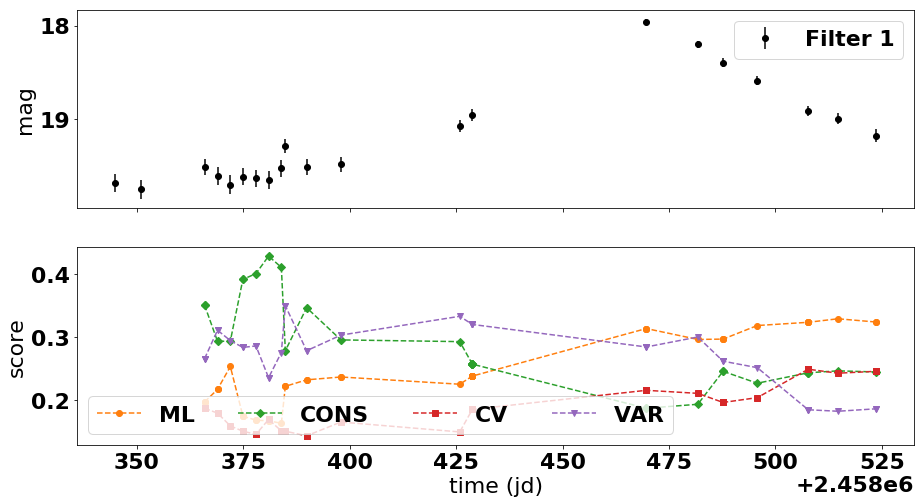

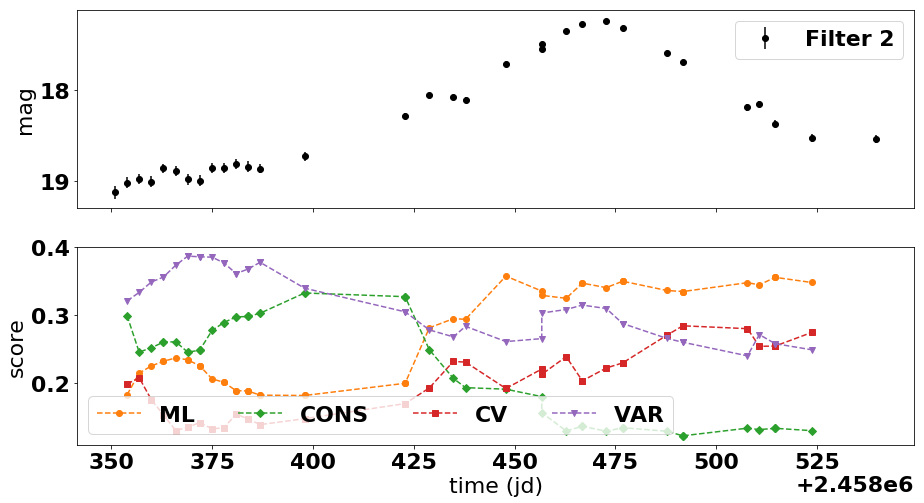

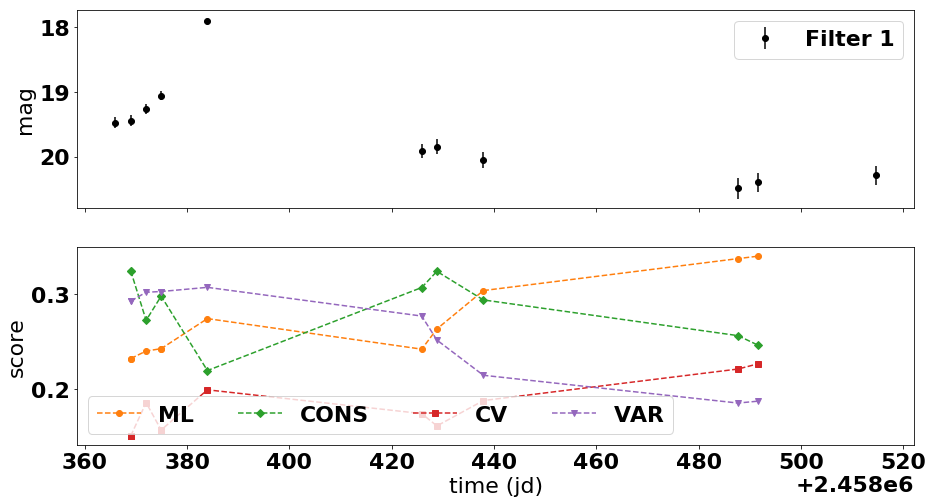

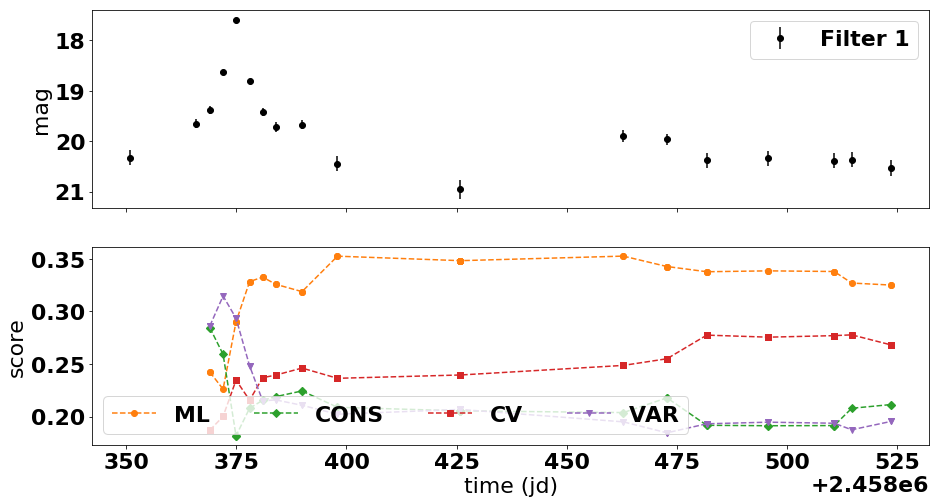

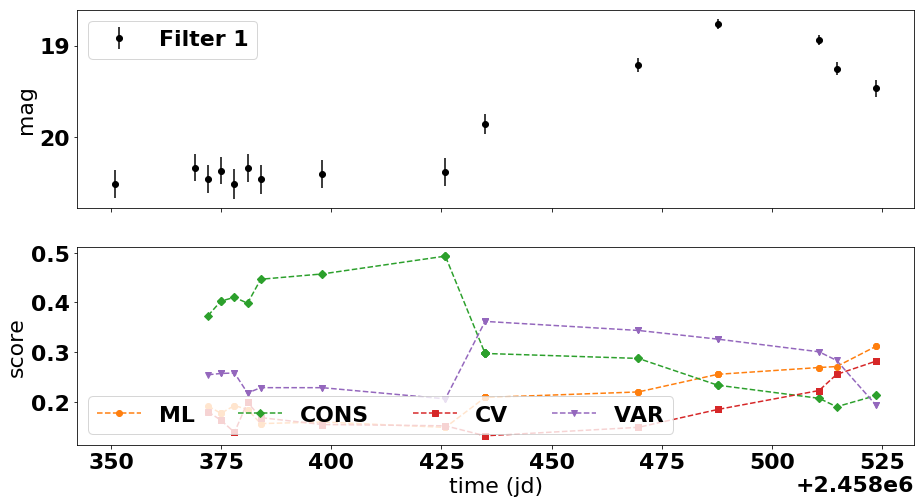

...

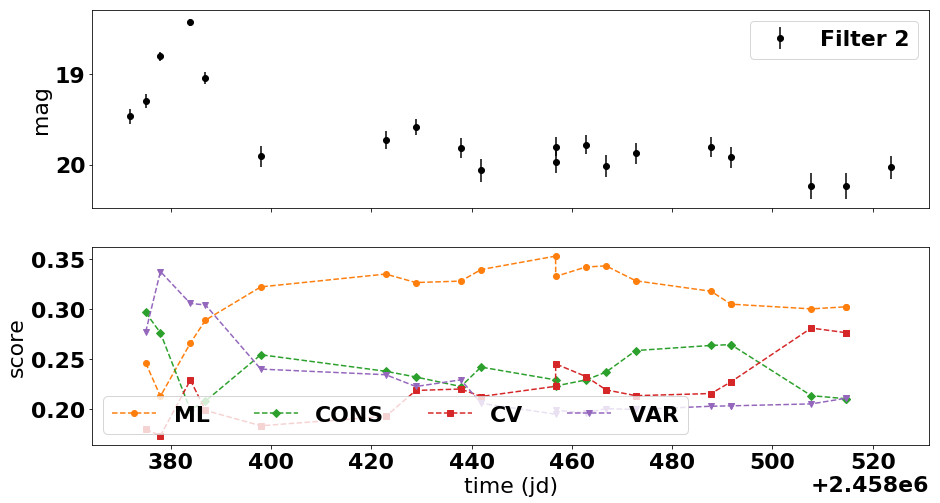

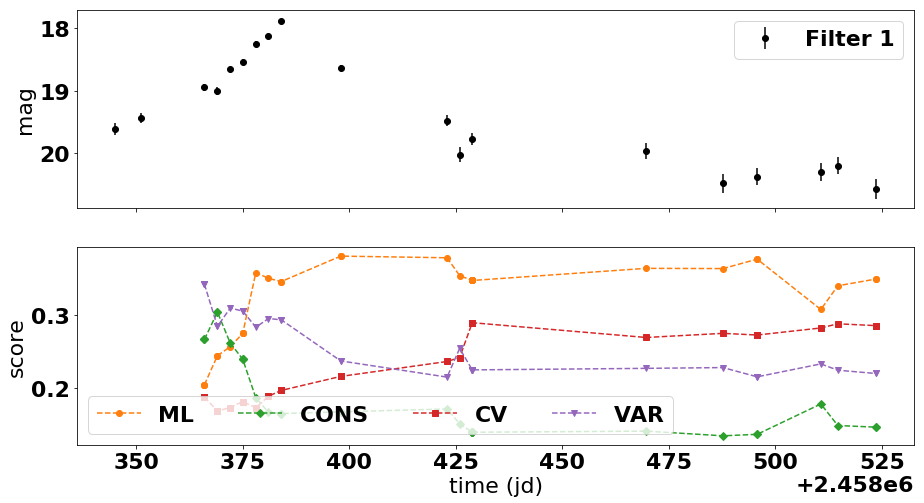

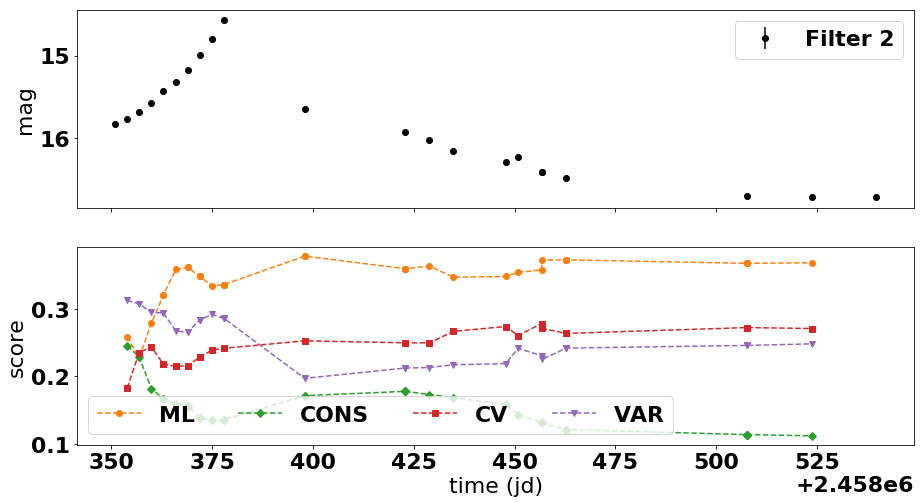

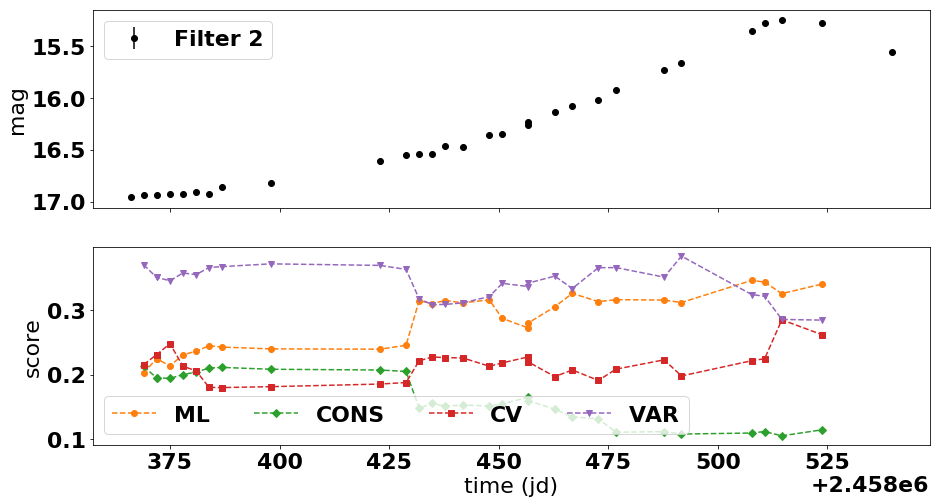

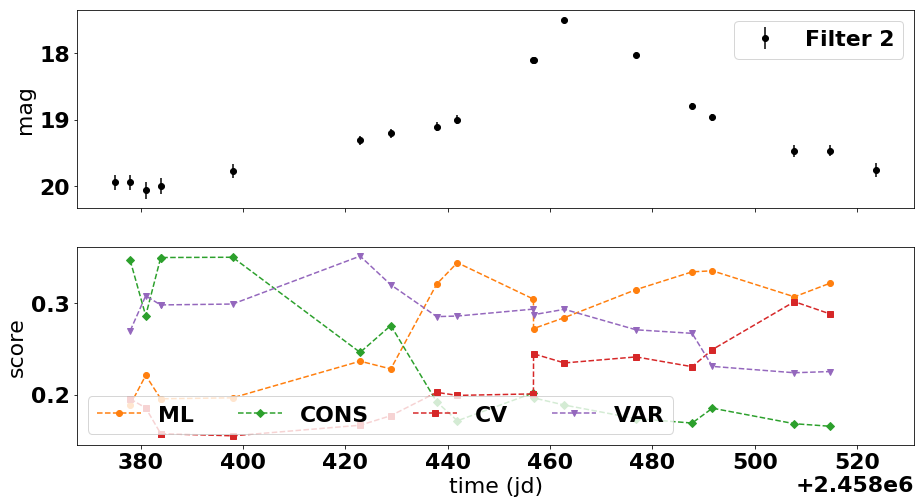

In [10]:
# Initialise containers
scores, tds, tes = [], [], []

# Loop over alert names
for index, alert_path in enumerate(events_of_interest.T[-2]):
    r = AlertReader(alert_path+'.avro')
    alerts = r.to_list()
    for alert_dict in alerts:
        # Apply classification iteratively
        output, indices = classify_one_alert_one_band_evol(alert_dict, events_of_interest.T[-1][index], rf, pca)
        
        # Plot light-curve and scores
        plot_score_evolution(alert_dict, events_of_interest.T[-1][index], output[1:5], indices)
        
        # pre-compute quantities for early detection: 
        td = compute_timestamp_microlensing(output, indices)
        te = lcs[lcs['aid'] == int(alert_path.split('/')[1])].tE.iloc[0]
        t0 = lcs[lcs['aid'] == int(alert_path.split('/')[1])].t0.iloc[0] + 2400000.5
        tes.append(te)
        tds.append((td-t0)/te)

We can also probe the early detection capabilities, following Eq. 11 & Fig 15 of Godines et al. 2019:

$$t_d = \dfrac{d - t_0}{t_e}$$

where $d$ is the timestamp at which the classifier correctly identifies the event as microlensing, $t_0$ is the (input) simulated peak, and $t_e$ is the (input) Einstein time:

Text(0, 0.5, 'Microlensing events\ncorrectly classified')

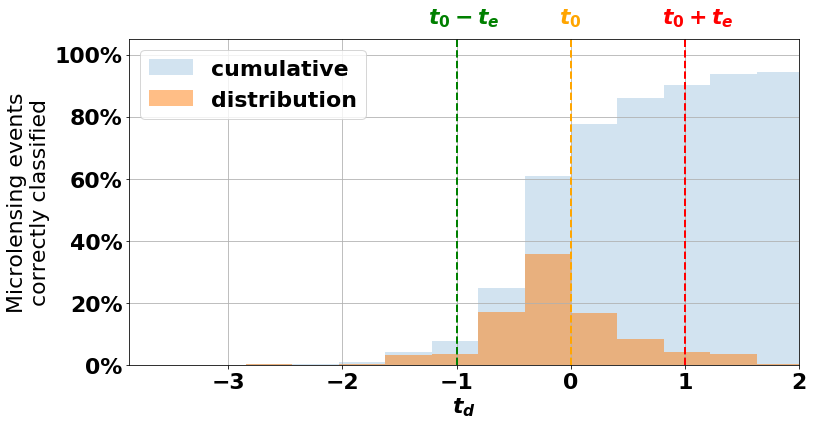

In [11]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
plt.hist(tds, bins=50, alpha=0.2, weights=np.ones(len(tds)) / len(tds), align='mid', cumulative=True, label='cumulative')
plt.hist(tds, bins=50, alpha=0.5, weights=np.ones(len(tds)) / len(tds), align='mid', label='distribution')
plt.grid()
plt.text(-1.25, 1.1, r'$t_0-t_e$', color='green')
plt.text(-0.1, 1.1, r'$t_0$', color='orange')
plt.text(0.8, 1.1, r'$t_0+t_e$', color='red')

plt.axvline(-1, color='green', ls='--', lw=2)
plt.axvline(0, color='orange', ls='--', lw=2)
plt.axvline(1, color='red', ls='--', lw=2)

plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.legend()
plt.xlim([None,2])
plt.xlabel(r'$t_d$')
plt.ylabel('Microlensing events\ncorrectly classified')

Note that the orange histogram would correspond to the quantity $t_d$ in Fig 15 of Godines et al. 2019, and the blue histogram is the cumulative distribution of $t_d$. We can clearly see that about 60% of events are correctly classified before the peak ($t_0$), and 90% of events are correctly classified before the end of the event ($t_0 + t_e$)!

Let's also have a look at the distribution of Einstein time, to see whether we are sensitive to a particular class of events:

Text(0, 0.5, 'Microlensing events')

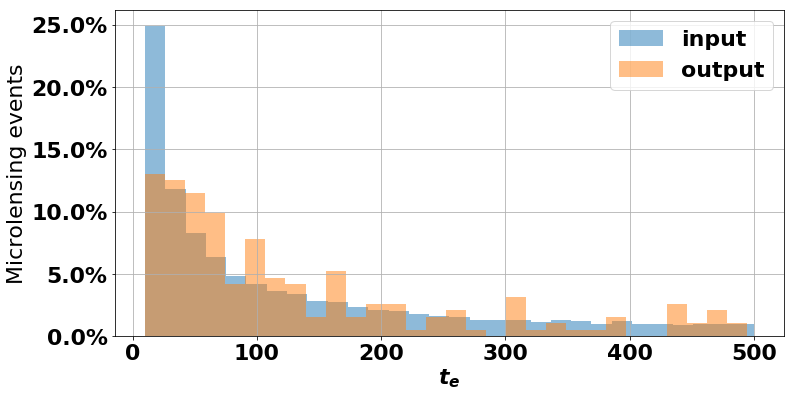

In [12]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))

intes = np.unique(lcs.tE)
plt.hist(intes, bins=30, alpha=0.5, weights=np.ones(len(intes)) / len(intes), align='mid', label='input')
plt.hist(tes, bins=30, alpha=0.5, weights=np.ones(len(tes)) / len(tes), align='mid', label='output')
plt.grid()

plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.legend()
plt.xlabel(r'$t_e$')
plt.ylabel('Microlensing events')

We can see that the distribution of $t_e$ for correctly classified events (orange) follows more or less the distribution of $t_e$ for all events. So there the classifier has no preference for short or long $t_e$.

## Alertification

So far, we processed full ligh-curves. While this is important for post-processing (using the Fink aggregated science products), this is a bit cheating regarding real-time capability of Fink. In reality, ZTF alerts come with 30 days of data (it would be 1 year for LSST), and there is no time to perform in _real-time_ cross-match with previous observation (earlier than 30 days). Hence, we would like to know the performance of the classifier on truncated light-curves, and assess its early detection capabilities.

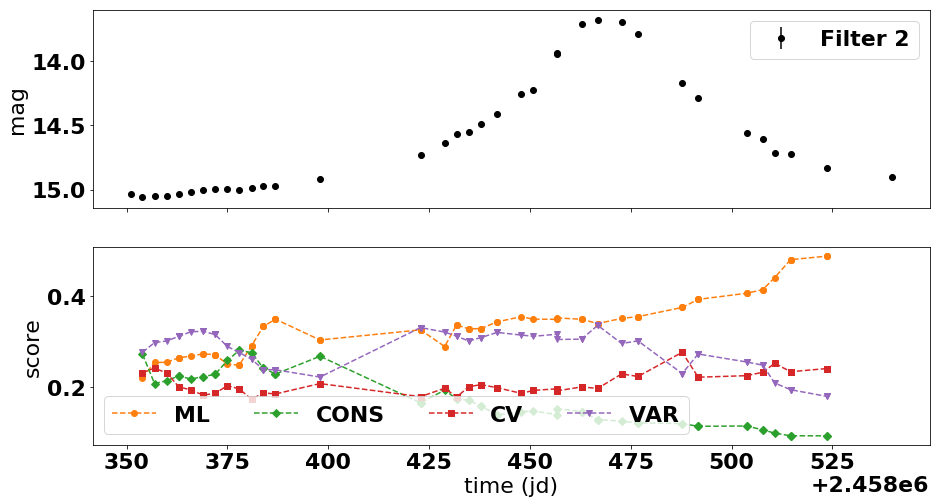

In [13]:
best_score_indices = events_of_interest.T[1].argsort()[::-1]
aids = [i for i in events_of_interest.T[-2][best_score_indices]]

# visual inspection of the highest score
for aid in aids[0:1]:
    r = AlertReader(aid+'.avro')
    alerts = r.to_list()
    for alert_dict in alerts:
        output, indices = classify_one_alert_one_band_evol(alert_dict, events_of_interest.T[-1][best_score_indices][index], rf, pca)
        plot_score_evolution(alert_dict, events_of_interest.T[-1][best_score_indices][index], output[1:5], indices)

In [14]:
outpath = 'alert_data'
best_score_aids = [aid.split('/')[1] for aid in aids]
for best_score_aid in best_score_aids:
    lo =  lcs[lcs['aid'] == int(best_score_aid)]
    write_alert_from_dataframe(lo, window=30, outpath=outpath)

In [15]:
list_of_alerts2 = glob.glob(os.path.join(outpath, '*'))
print('{} light-curves to be processed (2 bands)'.format(len(list_of_alerts2)))

def inner_loops(alerts: list) -> list:
    """ Artificial break for several inner For loops
    """
    for alert_dict in alerts:
        for band in [1, 2]:
            output = classify_one_alert_one_band(alert_dict, band, rf, pca)
            if 'ML' in output[0]:
                output.extend([alert_dict['objectId'], band, alert_dict['candidate']['jd']])
                return output
    return []

events_of_interest2 = []
tes, tas = [], []
for alert_path in list_of_alerts2:
    r = AlertReader(alert_path)
    alerts = r.to_list()
    alerts = sorted(alerts, key = lambda i: int(i['objectId'].split('_')[-1]))
    output = inner_loops(alerts)
    if len(output) > 0:
        events_of_interest2.append(output)
        
        # pre-compute quantities for early detection: 
        ta = output[-1]
        te = lcs[lcs['aid'] == int(alert_path.split('/')[1])].tE.iloc[0]
        t0 = lcs[lcs['aid'] == int(alert_path.split('/')[1])].t0.iloc[0] + 2400000.5
        tes.append(te)
        tas.append((ta-t0)/te)
events_of_interest2 = np.array(events_of_interest2)
print('{} light-curves flagged as ML'.format(len(events_of_interest2)))

148 light-curves to be processed (2 bands)
42 light-curves flagged as ML


roughly 25% accuracy

In [16]:
# # visual inspection of successful alerts
# for index, alert_path in enumerate(events_of_interest2.T[-2][8:10]):
#     print(alert_path)
#     r = AlertReader(alert_path+'.avro')
#     rfull = AlertReader('data/'+alert_path.split('/')[1])
#     full_alerts = rfull.to_list()
#     alerts = r.to_list()
#     for full_alert_dict in full_alerts:
#         for alert_dict in alerts:
#             jd = extract_field(alert_dict, "jd")
#             output, indices = classify_one_alert_one_band_evol(full_alert_dict, events_of_interest2.T[-1][index], rf, pca)
#             plot_score_evolution(full_alert_dict, events_of_interest2.T[-1][index], output[1:5], indices, highlight_region=[np.min(jd), np.max(jd)])

Let's now compute $t_a$, where $t_a = (d_a - t_0)/t_e$ and $d_a$ is the time of observation (so last measurement in an alert packet) for an alert flagged as microlensing event. This will give us a sense on how early alerts can detect a microlensing event (similarly to $t_d$ above, but with truncated light-curves):

Text(0, 0.5, 'Microlensing events\ncorrectly classified')

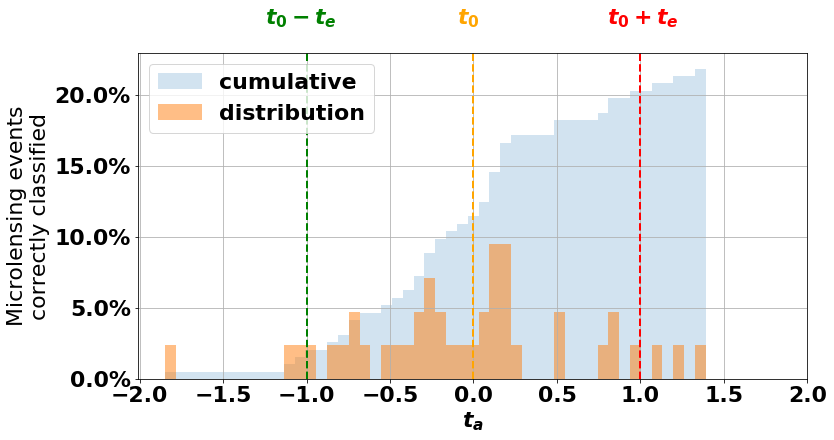

In [21]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
plt.hist(tas, bins=50, alpha=0.2, weights=np.ones(len(tas)) / len(tds), align='mid', cumulative=True, label='cumulative')
plt.hist(tas, bins=50, alpha=0.5, weights=np.ones(len(tas)) / len(tas), align='mid', label='distribution')
plt.grid()
plt.text(-1.25, 0.25, r'$t_0-t_e$', color='green')
plt.text(-0.1, 0.25, r'$t_0$', color='orange')
plt.text(0.8, 0.25, r'$t_0+t_e$', color='red')

plt.axvline(-1, color='green', ls='--', lw=2)
plt.axvline(0, color='orange', ls='--', lw=2)
plt.axvline(1, color='red', ls='--', lw=2)

plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.legend()
plt.xlim([None,2])
plt.xlabel(r'$t_a$')
plt.ylabel('Microlensing events\ncorrectly classified')

Note that we normalise the cumulative distribution by the total number of full light-curves flagged as ML. 

Not bad, 50% before $t_0$! So this is 50% (before $t_0$) of 25% (accuracy alerts) of 70% (accuracy full lc) initially i.e. ~20 light-curves out of ~200 initially flagged before $t_0$ with alerts. Note: we are talking about light-curve, and not filter bands (i.e. we flag an alert if at least of the 2 bands is classified as microlensing).

## To go beyond

1. The classification step is a bit slow (especially that we need to do it iteratively to see the score evolution), hence we restrict this exercise to the 200 first light-curves. As a simple exercise, it would be good to use Apache Spark to distribute the load and process the 10,000 light-curves simulated by Tristan.